# 1. Data Preprocessing

# (1) Reading the Training, the Development and the Testing Datasets 

In [1]:
import pandas as pd
from os import listdir

import matplotlib.pyplot as plt
import numpy as np

In [2]:
directory1 = 'data/train'
paths1 = listdir(directory1)
paths1.sort()
paths1

['anger-ratings-0to1.train.txt',
 'fear-ratings-0to1.train.txt',
 'joy-ratings-0to1.train.txt',
 'sadness-ratings-0to1.train.txt']

In [3]:
## Define the path of training dataset
path1 = paths1[3]

In [4]:
# If you want to restore x_train vectors, y_train_vectors, x_test_vectors, y_test_vectors: you can change the 'emotion' here 
# and then restore those vectors

emotion = path1.split("-")[0]
emotion

'sadness'

In [5]:
train_clean = pd.read_csv("train_clean.csv")

test_clean = pd.read_csv("test_clean.csv")

In [6]:
train_clean

,Unnamed: 0,SentID,Tweet,Emotion,Rating
0,0,10000,how fuck who heck moved fridge i knock landlor...,anger,0.938
1,1,10001,so indian uber driver called someone n word if...,anger,0.896
2,2,10002,<user> i asked parcel delivered pick store add...,anger,0.896
3,3,10003,ef whichever butt wipe pulled fire alarm davis...,anger,0.896
4,4,10004,do join <user> put phone talk rude taking mone...,anger,0.896
...,...,...,...,...,...
3955,3955,40855,common app randomly logged i writing last part...,sadness,0.833
3956,3956,40856,i would rather laugh rarest genius beautiful a...,sadness,0.688
3957,3957,40857,if invest new film i stop asking invest new fi...,sadness,0.458
3958,3958,40858,just watched django unchained other people may...,sadness,0.333


In [7]:
train = train_clean[train_clean["Emotion"] == emotion]
train

,Unnamed: 0,SentID,Tweet,Emotion,Rating
2827,2827,40000,depression sucks depression,sadness,0.958
2828,2828,40001,feeling worthless always depression,sadness,0.958
2829,2829,40002,feeling worthless always,sadness,0.958
2830,2830,40003,my fibromyalgia really bad lately good mental ...,sadness,0.946
2831,2831,40004,im think ima lay bed day sulk life hitting har...,sadness,0.934
...,...,...,...,...,...
3955,3955,40855,common app randomly logged i writing last part...,sadness,0.833
3956,3956,40856,i would rather laugh rarest genius beautiful a...,sadness,0.688
3957,3957,40857,if invest new film i stop asking invest new fi...,sadness,0.458
3958,3958,40858,just watched django unchained other people may...,sadness,0.333


In [8]:
test = test_clean[test_clean["Emotion"] == emotion]
test

,Unnamed: 0,SentID,Tweet,Emotion,Rating
2469,2469,40860,my <number> teens sons left car get haircuts i...,sadness,0.667
2470,2470,40861,my <number> teens sons left car get haircuts i...,sadness,0.458
2471,2471,40862,hart ramsey uplift if still discouraged means ...,sadness,0.396
2472,2472,40863,<user> i nearly dropped phone sink hahahaha,sadness,0.271
2473,2473,40864,whenever i feeling sad i listen monsta x hug t...,sadness,0.604
...,...,...,...,...,...
3137,3137,41528,why candice constantly pout gb bo,sadness,0.396
3138,3138,41529,<user> unhappy redbus cc i talked week still i...,sadness,0.604
3139,3139,41530,<user> pull a few weeks ago sadly theres game ...,sadness,0.479
3140,3140,41531,i buying art supplies i debating serious buy a...,sadness,0.375


In [9]:
train_tweets = list(train['Tweet'])
train_intensities = list(train['Rating'])
train_tweets[:10]

['depression sucks depression',
 'feeling worthless always depression',
 'feeling worthless always',
 'my fibromyalgia really bad lately good mental state i feel overwhelmed anxiety bipolar depression',
 'im think ima lay bed day sulk life hitting hard rn',
 'so i try i fail i try i still fail confused lost',
 'extreme sadness',
 'life one word depressing',
 'panic attacks worst feeling really sick still shaking i sleep anxiety depression',
 'feel grim ugly atm']

In [10]:
train_intensities[:10]

[0.958,
 0.958,
 0.958,
 0.946,
 0.934,
 0.917,
 0.917,
 0.917,
 0.917,
 0.8959999999999999]

In [11]:
test_tweets = list(test['Tweet'])
test_intensities = list(test['Rating'])

In [12]:
# show the distribution of text length (from below: there is no need to truncate any of texts)
def show_text_len(train):
    train["text_len"] = train['Tweet'].map(lambda x: len(x.split()))
    return train["text_len"]

In [13]:
# show Max Text Length of All Datasets for comparsion

all_tweets_max_len = pd.DataFrame(np.array([max(show_text_len(train)), max(show_text_len(test))]))

all_tweets_max_len.index = ['train', 'test']
all_tweets_max_len.columns = ['max text length']

all_tweets_max_len

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,max text length
train,32
test,27


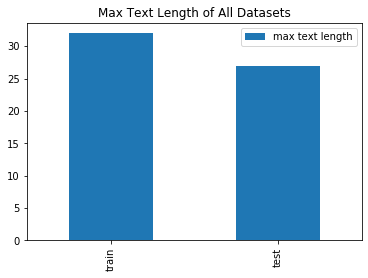

In [14]:
%matplotlib inline
import matplotlib.pyplot as plt
all_tweets_max_len.plot(kind='bar')
plt.title('Max Text Length of All Datasets')
plt.show()

In [15]:
'''
we set the length to which each tweet vector will be zero padded to.
this is based on the maximum length we got on the training set - we do not want to remove
any words as the maximun length of the training set is not very big.
'''

max_len = max(show_text_len(train))
max_len

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


32

# 2. Text Data Preparation（Feature Extraction)

# (1) Load Pre-trained Word Vectors

In [16]:
import numpy as np
import gensim
from nltk import word_tokenize

In [17]:
word_vector_path = "files/wv_models/"

# 1) Glove

In [18]:
def loadGloveModel(gloveFile):
    print("Loading Glove Model")
    f = open(gloveFile,'r', encoding = 'UTF-8')
    model = {}
    num = 1
    for line in f:
        try:
            splitLine = line.split()
            word = splitLine[0]
            coefs = np.asarray(splitLine[1:], dtype = 'float32')
            model[word] = coefs
            num += 1
        except Exception as e:
            print("Failed at line " + str(num))
    print("Done. Found %s word vectors." %len(model)," words loaded!")
    return model

In [19]:
# To download the pretrained glove model (2B tweets, 27B tokens) - [https://nlp.stanford.edu/projects/glove/   glove.twitter.27B.zip]
# choose glove.twitter.27B.200d.txt from glove.twitter.27B.zip. [200-dimension vectors]

wv_model_path1 = word_vector_path + "glove.twitter.27B.200d.txt"
 
wv_model_g = loadGloveModel(wv_model_path1)


Loading Glove Model
Done. Found 1193514 word vectors.  words loaded!


# 2) Word2Vec

In [20]:
# To download the pretrained word2vec model  - [https://github.com/FredericGodin/TwitterEmbeddings]

wv_model_path2 = word_vector_path + "word2vec_twitter_tokens.bin"
wv_model_w = gensim.models.KeyedVectors.load_word2vec_format(wv_model_path2, binary=True, unicode_errors='ignore')

In [21]:
words = list(wv_model_w.wv.vocab)
print('Word Vectors: %d' % len(words))

Word Vectors: 3039345


C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  """Entry point for launching an IPython kernel.


# 3) Define Averaged Word Embeddings

In [22]:
w2v_dimensions_g = len(wv_model_g['word'])
w2v_dimensions_w = len(wv_model_w['word'])

In [23]:
print(w2v_dimensions_g,w2v_dimensions_w)

200 400


In [24]:
def get_word_embeddings(word, model, dimensions):
    vec_rep = np.zeros(dimensions)
    if word in model:
        vec_rep = model[word]
    return vec_rep

# (2) Load Lexicon Feature Vectors

In [25]:
import json
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import normalize

lexicons_path = "files/lexicons/"

In [26]:
paths2 = listdir(lexicons_path)
paths2.sort()
paths2

['0.Emoji_Vectors',
 '1.NRC-Emotion-Intensity-Lexicon',
 '3.NRC-Emotion-Lexicon',
 '4.NRC-Hashtag-Emotion-Lexicon',
 '5.NRC-Emoticon-Lexicon',
 '6.NRC-Emoticon-AffLexNegLex',
 '7.NRC-Hashtag-Sentiment-AffLexNegLex',
 '8.NRC-Hashtag-Sentiment-Lexicon',
 '9.DepecheMood_V1.0']

In [27]:
non_linear_factor = PolynomialFeatures(3)

In [28]:
import re
from nltk.corpus import stopwords
from nltk import bigrams
# prepare for clean Hashtag Emotion Intensity Lexicons...

def remove_stopwords(string):
    split_string = \
        [word for word in string.split()
         if word not in stopwords.words('english')]
    
    return " ".join(split_string)

def clean_str(string):  
    string = string.replace("\\n", " ")
    string = string.replace("_NEG", "")
    string = string.replace("_NEGFIRST", "")
    string = re.sub(r"@[A-Za-z0-9_(),!?\'\`]+", " ", string) # removing any twitter handle mentions
    string = re.sub(r"\d+", " ", string) # removing any words with numbers
    string = re.sub(r"_", " ", string)
    string = re.sub(r":", " ", string)
    string = re.sub(r"/", " ", string)
    string = re.sub(r"#", " ", string)
    string = re.sub(r"\.", " ", string)
    string = re.sub(r"\*", " ", string)
    string = re.sub(r"\'s", " ", string)
    string = re.sub(r"\'m", " am", string)
    string = re.sub(r"\'ve", " have", string)
    string = re.sub(r"n\'t", " not", string)
    string = re.sub(r"n\’t", " not", string)
    string = re.sub(r"\'re", " are", string)
    string = re.sub(r"\’re", " are", string)
    string = re.sub(r"\'d", " would", string)
    string = re.sub(r"\’d", " would", string)
    string = re.sub(r"\'ll", " will", string)
    string = re.sub(r"\’ll", " will", string)
    string = re.sub(r"'", " ", string)
    string = re.sub(r",", "", string)
    string = re.sub(r"!", " !", string)
    string = re.sub(r"\(", "", string)
    string = re.sub(r"\)", "", string)
    string = re.sub(r"\?", " ?", string)
    string = re.sub(r"-", " ", string)
    string = re.sub(r"<", " ", string)
    string = re.sub(r">", " ", string)
    string = re.sub(r";", " ", string)
    string = re.sub(r"\s{2,}", " ", string)

    return remove_stopwords(string.strip().lower())

# 1) Emoji Vectors

In [29]:
with open(('%s%s/' %(lexicons_path, paths2[0])) + listdir('%s%s/' %(lexicons_path, paths2[0]))[0], encoding = 'UTF-8') \
as emoji_file:
    emoji_list = json.load(emoji_file)
    
emoji_dict = dict()
for emoji in emoji_list:
    emoji_dict[emoji["emoji"]] = (emoji["name"], emoji["polarity"])

In [30]:
# do a sanity check
print(emoji_dict["😂"])

('joy', 3)


In [31]:

def get_emoji_intensity(word):
    score = 0.0
    if word in emoji_dict.keys():
        score = float(emoji_dict[word][1])
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]
#non_linear_factor.fit_transform([vec_rep])[0]

In [32]:
# do a sanity check
get_emoji_intensity("😂")

array([ 1.,  3.,  9., 27.])

# 2) Emotion Intensity Lexicon

In [33]:
affect_intensity_file_path = ('%s%s/' %(lexicons_path, paths2[1])) + listdir('%s%s/' %(lexicons_path, paths2[1]))[0]

def get_word_affect_intensity_dict(emotion):
    word_intensities = dict()

    with open(affect_intensity_file_path) as affect_intensity_file:
        for line in affect_intensity_file:
            word_int_array = line.replace("\n", "").split("\t")

            if (word_int_array[1] == emotion):
                word_intensities[word_int_array[0]] = float(word_int_array[2])

    return word_intensities

In [34]:
word_intensities = get_word_affect_intensity_dict(emotion)
word_intensities

{'heartbreaking': 0.969,
 'mourning': 0.969,
 'tragic': 0.961,
 'holocaust': 0.953,
 'suicidal': 0.941,
 'misery': 0.938,
 'massacre': 0.931,
 'euthanasia': 0.927,
 'depression': 0.925,
 'bereavement': 0.922,
 'fatal': 0.922,
 'grieving': 0.922,
 'bereaved': 0.92,
 'devastation': 0.917,
 'death': 0.915,
 'suicide': 0.912,
 'devastated': 0.912,
 'catastrophe': 0.911,
 'horrifying': 0.907,
 'died': 0.906,
 'depressing': 0.906,
 'tragedy': 0.906,
 'anguish': 0.902,
 'agony': 0.9,
 'deadly': 0.898,
 'weeping': 0.896,
 'stillbirth': 0.891,
 'deceased': 0.891,
 'murderer': 0.877,
 'cancer': 0.875,
 'rape': 0.875,
 'devastating': 0.875,
 'dying': 0.875,
 'morbidity': 0.864,
 'sadness': 0.864,
 'perish': 0.859,
 'grief': 0.859,
 'abandonment': 0.859,
 'traumatic': 0.859,
 'execution': 0.859,
 'atrocity': 0.859,
 'depressed': 0.859,
 'crucifixion': 0.859,
 'cadaver': 0.853,
 'betrayed': 0.848,
 'treachery': 0.848,
 'destroyed': 0.844,
 'sorrow': 0.844,
 'funeral': 0.844,
 'persecution': 0.844,


In [35]:
def get_emo_int_vector(word):
    score = 0.0
    if word in word_intensities.keys():
        score = float(word_intensities[word])
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [36]:
get_emo_int_vector("furious")

array([1., 0., 0., 0.])

# 3) SentiWordNet

In [37]:
from nltk.corpus import sentiwordnet as swn

In [38]:
def get_sentiwordnetscore(word):
    
    vec_rep = np.zeros(2)
    
    synsetlist = list(swn.senti_synsets(word))

    if synsetlist:
        vec_rep[0] = synsetlist[0].pos_score()
        vec_rep[1] = synsetlist[0].neg_score()

    return non_linear_factor.fit_transform([vec_rep])[0]

In [39]:
get_sentiwordnetscore("fury")

array([1.      , 0.25    , 0.5     , 0.0625  , 0.125   , 0.25    ,
       0.015625, 0.03125 , 0.0625  , 0.125   ])

# 4) Sentiment Emotion Presence Lexicon

In [40]:
sentiment_emotion_lex_file_path = ('%s%s/' %(lexicons_path, paths2[2])) + listdir('%s%s/' %(lexicons_path, paths2[2]))[0]

def get_affect_presence_list(emotion):
    word_list = list()
    
    with open(sentiment_emotion_lex_file_path) as sentiment_emotion_lex_file:
        lines = sentiment_emotion_lex_file.readlines()[1:] 
        for line in lines:
            word_array = line.replace("\n", "").split("\t")

            if (word_array[1] == emotion and word_array[2] == '1'):
                word_list.append(word_array[0])
                
    return word_list

In [41]:
word_list = get_affect_presence_list(emotion)
word_list

['abandon',
 'abandoned',
 'abandonment',
 'abduction',
 'abortion',
 'abortive',
 'abscess',
 'absence',
 'absent',
 'absentee',
 'abuse',
 'abysmal',
 'abyss',
 'accident',
 'accursed',
 'ache',
 'aching',
 'adder',
 'adrift',
 'adultery',
 'adverse',
 'adversity',
 'afflict',
 'affliction',
 'affront',
 'aftermath',
 'aggravating',
 'agony',
 'ail',
 'ailing',
 'alcoholism',
 'alienated',
 'alienation',
 'anathema',
 'anchorage',
 'anguish',
 'animosity',
 'annihilated',
 'annihilation',
 'annulment',
 'anthrax',
 'antisocial',
 'anxiety',
 'apathetic',
 'apathy',
 'apologize',
 'appendicitis',
 'arid',
 'arraignment',
 'arsenic',
 'art',
 'ashamed',
 'ashes',
 'assailant',
 'assassin',
 'assassination',
 'atherosclerosis',
 'atrocity',
 'atrophy',
 'attacking',
 'attenuation',
 'austere',
 'autopsy',
 'avalanche',
 'awful',
 'backwater',
 'bacteria',
 'bad',
 'badly',
 'bang',
 'banish',
 'banished',
 'banishment',
 'bankrupt',
 'bankruptcy',
 'banshee',
 'barren',
 'bastard',
 'ba

In [42]:
def get_sentiment_emotion_feature(word):
    score = 0.0
    if word in word_list:
        score = 1.0
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [43]:
get_sentiment_emotion_feature("fury")

array([1., 1., 1., 1.])

# 5) Hashtag Emotion Intensity

In [44]:
hashtag_emotion_lex_file_path = ('%s%s/' %(lexicons_path, paths2[3])) + listdir('%s%s/' %(lexicons_path, paths2[3]))[0]
    
def get_hashtag_emotion_intensity(emotion):
    hastag_intensities = dict()
    
    with open(hashtag_emotion_lex_file_path) as hashtag_emotion_lex_file:
        for line in hashtag_emotion_lex_file:
            word_array = line.replace("\n", "").split("\t")
            
            if (word_array[0] == emotion):
                hastag_intensities[word_array[1]] = float(word_array[2])

    return hastag_intensities

In [45]:
hashtag_emotion_intensities = get_hashtag_emotion_intensity(emotion)

In [46]:

def get_hashtag_emotion_vector(word):
    score = 0.0
    if word in hashtag_emotion_intensities.keys():
        score = float(hashtag_emotion_intensities[word])
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [47]:
get_hashtag_emotion_vector("furious")

array([1., 0., 0., 0.])

# 6) Emoticon Sentiment Lexicon¶

In [48]:
listdir('%s%s/' %(lexicons_path, paths2[4]))

['bigrams-pmilexicon.txt', 'pairs-pmilexicon.txt', 'unigrams-pmilexicon.txt']

In [49]:
emoticon_lexicon_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[4])) + listdir('%s%s/' %(lexicons_path, paths2[4]))[2]
emoticon_lexicon_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[4])) + listdir('%s%s/' %(lexicons_path, paths2[4]))[0]
emoticon_lexicon_pairs_file_path = ('%s%s/' %(lexicons_path, paths2[4])) + listdir('%s%s/' %(lexicons_path, paths2[4]))[1]
pair_split_string = "---"
    
def get_emoticon_lexicon_unigram_dict():
    emoticon_lexicon_unigrams = dict()
    with open(emoticon_lexicon_unigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_lexicon_unigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_lexicon_unigrams

def get_emoticon_lexicon_bigram_dict():
    emoticon_lexicon_bigrams = dict()
    with open(emoticon_lexicon_bigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_lexicon_bigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_lexicon_bigrams


In [50]:
emoticon_lexicon_unigram_dict = get_emoticon_lexicon_unigram_dict()

In [51]:
emoticon_lexicon_bigram_dict = get_emoticon_lexicon_bigram_dict()

In [52]:
#emoticon_lexicon_pairs_dict = get_emoticon_lexicon_pairs_dict()

In [53]:

def get_unigram_sentiment_emoticon_lexicon_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_lexicon_unigram_dict.keys():
        vec_rep = emoticon_lexicon_unigram_dict[word]
        
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]

def get_bigram_sentiment_emoticon_lexicon_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_lexicon_bigram_dict.keys():
        vec_rep = emoticon_lexicon_bigram_dict[word]
    return non_linear_factor.fit_transform([vec_rep])[0]


In [54]:
get_unigram_sentiment_emoticon_lexicon_vector('fury')

array([ 1.00000e+00, -6.20000e-02,  1.70000e+01,  1.90000e+01,
        3.84400e-03, -1.05400e+00, -1.17800e+00,  2.89000e+02,
        3.23000e+02,  3.61000e+02, -2.38328e-04,  6.53480e-02,
        7.30360e-02, -1.79180e+01, -2.00260e+01, -2.23820e+01,
        4.91300e+03,  5.49100e+03,  6.13700e+03,  6.85900e+03])

In [55]:
get_bigram_sentiment_emoticon_lexicon_vector('add everyone')

array([1.00000000e+00, 7.35200000e+00, 1.48500000e+03, 1.00000000e+00,
       5.40519040e+01, 1.09177200e+04, 7.35200000e+00, 2.20522500e+06,
       1.48500000e+03, 1.00000000e+00, 3.97389598e+02, 8.02670774e+04,
       5.40519040e+01, 1.62128142e+07, 1.09177200e+04, 7.35200000e+00,
       3.27475912e+09, 2.20522500e+06, 1.48500000e+03, 1.00000000e+00])

# 7) Emoticon Sentiment Aff-Neg Lexicon

In [56]:
listdir('%s%s/' %(lexicons_path, paths2[5]))

['Emoticon-AFFLEX-NEGLEX-bigrams.txt', 'Emoticon-AFFLEX-NEGLEX-unigrams.txt']

In [57]:
emoticon_afflex_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[5])) + listdir('%s%s/' %(lexicons_path, paths2[5]))[1]
emoticon_afflex_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[5])) + listdir('%s%s/' %(lexicons_path, paths2[5]))[0]
    
def get_emoticon_afflex_unigram_dict():
    emoticon_afflex_unigrams = dict()
    with open(emoticon_afflex_unigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_afflex_unigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_afflex_unigrams

def get_emoticon_afflex_bigram_dict():
    emoticon_afflex_bigrams = dict()
    with open(emoticon_afflex_bigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_afflex_bigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_afflex_bigrams

In [58]:
emoticon_afflex_unigram_dict = get_emoticon_afflex_unigram_dict()

In [59]:
emoticon_afflex_bigram_dict = get_emoticon_afflex_bigram_dict()

In [60]:

def get_unigram_sentiment_emoticon_afflex_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_afflex_unigram_dict.keys():
        vec_rep = emoticon_afflex_unigram_dict[word]
        
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]

def get_bigram_sentiment_emoticon_afflex_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_afflex_bigram_dict.keys():
        vec_rep = emoticon_afflex_bigram_dict[word]
        
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]


In [61]:
get_unigram_sentiment_emoticon_afflex_vector('fury')

array([1.00000e+00, 6.40000e-02, 1.40000e+01, 1.40000e+01, 4.09600e-03,
       8.96000e-01, 8.96000e-01, 1.96000e+02, 1.96000e+02, 1.96000e+02,
       2.62144e-04, 5.73440e-02, 5.73440e-02, 1.25440e+01, 1.25440e+01,
       1.25440e+01, 2.74400e+03, 2.74400e+03, 2.74400e+03, 2.74400e+03])

# 8) Hashtag Sentiment Aff-Neg Lexicon

In [62]:
listdir('%s%s/' %(lexicons_path, paths2[6]))

['HS-AFFLEX-NEGLEX-bigrams.txt', 'HS-AFFLEX-NEGLEX-unigrams.txt']

In [63]:
hashtag_affneglex_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[6])) + listdir('%s%s/' %(lexicons_path, paths2[6]))[1]
hashtag_affneglex_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[6])) + listdir('%s%s/' %(lexicons_path, paths2[6]))[0]
    
def get_hashtag_affneglex_unigram_dict():
    hashtag_affneglex_unigrams = dict()
    with open(hashtag_affneglex_unigrams_file_path) as hashtag_sent_lex_file:
        for line in hashtag_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            hashtag_affneglex_unigrams[clean_str(word_array[0])] = np.array([float(val) for val in word_array[1:]])
    
    return hashtag_affneglex_unigrams

def get_hashtag_affneglex_bigram_dict():
    hashtag_affneglex_bigrams = dict()
    with open(hashtag_affneglex_bigrams_file_path) as hashtag_sent_lex_file:
        for line in hashtag_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            hashtag_affneglex_bigrams[clean_str(word_array[0])] = np.array([float(val) for val in word_array[1:]])

    return hashtag_affneglex_bigrams

In [64]:
hashtag_affneglex_unigram_dict = get_hashtag_affneglex_unigram_dict()

In [65]:
hashtag_affneglex_bigram_dict = get_hashtag_affneglex_bigram_dict()

In [66]:
def get_unigram_sentiment_hashtag_affneglex_vector(word):
    
    vec_rep = np.zeros(3)
    if word in hashtag_affneglex_unigram_dict.keys():
        vec_rep = hashtag_affneglex_unigram_dict[word]
        
    return [vec_rep]
def get_bigram_sentiment_hashtag_affneglex_vector(word):
    
    vec_rep = np.zeros(3)
    if word in hashtag_affneglex_bigram_dict.keys():
        vec_rep = hashtag_affneglex_bigram_dict[word]
        
    return non_linear_factor.fit_transform([vec_rep])[0]

In [67]:
get_unigram_sentiment_hashtag_affneglex_vector("great")

[array([  0.403, 214.   , 203.   ])]

In [68]:
get_bigram_sentiment_hashtag_affneglex_vector('good luck')

array([ 1.0000000e+00, -2.3200000e-01,  7.0000000e+00,  1.2000000e+01,
        5.3824000e-02, -1.6240000e+00, -2.7840000e+00,  4.9000000e+01,
        8.4000000e+01,  1.4400000e+02, -1.2487168e-02,  3.7676800e-01,
        6.4588800e-01, -1.1368000e+01, -1.9488000e+01, -3.3408000e+01,
        3.4300000e+02,  5.8800000e+02,  1.0080000e+03,  1.7280000e+03])

# 9) Hashtag Sentiment Lexicon

In [69]:
listdir('%s%s/' %(lexicons_path, paths2[7]))

['HS-bigrams.txt', 'HS-pairs.txt', 'HS-unigrams.txt']

In [70]:
hash_sent_lex_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[7])) + listdir('%s%s/' %(lexicons_path, paths2[7]))[2]
hash_sent_lex_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[7])) + listdir('%s%s/' %(lexicons_path, paths2[7]))[0]
hash_sent_lex_pairs_file_path = ('%s%s/' %(lexicons_path, paths2[7])) + listdir('%s%s/' %(lexicons_path, paths2[7]))[1]
pair_split_string = "---"


def get_hash_sent_lex_unigram_dict():
    hash_sent_lex_unigrams = dict()
    with open(hash_sent_lex_unigrams_file_path) as hash_sent_lex_file:
        for line in hash_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            if clean_str(word_array[0]):
                hash_sent_lex_unigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return hash_sent_lex_unigrams

def get_hash_sent_lex_bigram_dict():
    hash_sent_lex_bigrams = dict()
    with open(hash_sent_lex_bigrams_file_path) as hash_sent_lex_file:
        for line in hash_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            if clean_str(word_array[0]):
                hash_sent_lex_bigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return hash_sent_lex_bigrams


In [71]:
hash_sent_lex_unigram_dict = get_hash_sent_lex_unigram_dict()

In [72]:
hash_sent_lex_bigram_dict = get_hash_sent_lex_bigram_dict()

In [73]:

def get_unigram_sentiment_hash_sent_lex_vector(word):
    vec_rep = np.zeros(3)
    if word in hash_sent_lex_unigram_dict.keys():
        vec_rep = hash_sent_lex_unigram_dict[word]
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]
    
def get_bigram_sentiment_hash_sent_lex_vector(word):
    vec_rep = np.zeros(3)
    if word in hash_sent_lex_bigram_dict.keys():
        vec_rep = hash_sent_lex_bigram_dict[word]
    
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]


In [74]:
get_unigram_sentiment_hash_sent_lex_vector('#fabulous')

array([1.00000000e+00, 7.52600000e+00, 2.30100000e+03, 2.00000000e+00,
       5.66406760e+01, 1.73173260e+04, 1.50520000e+01, 5.29460100e+06,
       4.60200000e+03, 4.00000000e+00, 4.26277728e+02, 1.30330195e+05,
       1.13281352e+02, 3.98471671e+07, 3.46346520e+04, 3.01040000e+01,
       1.21828769e+10, 1.05892020e+07, 9.20400000e+03, 8.00000000e+00])

In [75]:
get_bigram_sentiment_hash_sent_lex_vector(". #perfection")

array([1.00000000e+00, 8.88800000e+00, 4.49300000e+03, 1.00000000e+00,
       7.89965440e+01, 3.99337840e+04, 8.88800000e+00, 2.01870490e+07,
       4.49300000e+03, 1.00000000e+00, 7.02121283e+02, 3.54931472e+05,
       7.89965440e+01, 1.79422492e+08, 3.99337840e+04, 8.88800000e+00,
       9.07004112e+10, 2.01870490e+07, 4.49300000e+03, 1.00000000e+00])

# 10) Depeche Mood

In [76]:
depeche_mood_file_path = ('%s%s/' %(lexicons_path, paths2[8])) + listdir('%s%s/' %(lexicons_path, paths2[8]))[0]

In [77]:
def get_depeche_vector_dict():
    depeche_vector_dict = dict()
    with open(depeche_mood_file_path) as depeche_mood_file:
        lines = depeche_mood_file.readlines()[1:] 
        for line in lines:
            word_array = line.replace("\n", "").split("\t")
            depeche_vector_dict[word_array[0].split("#")[0]] = np.array([float(val) for val in word_array[1:]])
    
    return depeche_vector_dict

In [78]:
depeche_vector_dict = get_depeche_vector_dict()

In [79]:
print(len(depeche_vector_dict["0"]))

8


In [80]:
def get_depeche_mood_vector(word):
    vec_rep = np.zeros(8)
    if word in depeche_vector_dict.keys():
        vec_rep = np.array(depeche_vector_dict[word])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [81]:
get_depeche_mood_vector("120th")

array([1.        , 0.        , 0.5643932 , 0.        , 0.        ,
       0.        , 0.1727759 , 0.2628309 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.31853969, 0.        , 0.        ,
       0.        , 0.09751354, 0.14833997, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.02985151,
       0.04541085, 0.        , 0.06908008, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

# (4)  Prepare Embedding Matrix

In [82]:
def is_active_vector_method(string):
    return int(string)


def learn_unigram_word_embedding(word):

    word_feature_embedding_dict = dict()

    '''Pre-trained Word embeddings'''
    index = 0
    word_feature_embedding_dict[index] = get_word_embeddings(word, wv_model_g, w2v_dimensions_g)

    index = 1
    word_feature_embedding_dict[index] = get_word_embeddings(word, wv_model_w, w2v_dimensions_w)

    '''NRC Emotion Intensity Lexicon'''
    index = 2
    word_feature_embedding_dict[index] = get_emo_int_vector(word)
           

    '''WordNet'''
    index = 3
    word_feature_embedding_dict[index] = get_sentiwordnetscore(word)
           

    '''NRC Sentiment Lexicon'''
    index = 4
    word_feature_embedding_dict[index] = get_sentiment_emotion_feature(word)

    index = 5
    word_feature_embedding_dict[index] = get_unigram_sentiment_emoticon_lexicon_vector(word)

    index = 6
    word_feature_embedding_dict[index] = get_unigram_sentiment_emoticon_afflex_vector(word)

    '''NRC Hashtag Lexicon'''
    index = 7
    word_feature_embedding_dict[index] = get_hashtag_emotion_vector(word)
            

    index = 8
    word_feature_embedding_dict[index] = get_unigram_sentiment_hash_sent_lex_vector(word)
           

    index = 9
    word_feature_embedding_dict[index] = get_unigram_sentiment_hashtag_affneglex_vector(word)

    '''Emoji Polarities'''
    index = 10
    word_feature_embedding_dict[index] = get_emoji_intensity(word)
    
    '''Depeche Mood'''
    index = 11
    word_feature_embedding_dict[index] = get_depeche_mood_vector(word)
        

    return word_feature_embedding_dict

In [83]:
unigram_feature_string = '111111111111'

In [84]:
feature_index_mapping = \
    {
        0: "Glove[Twitter]",
        1: "Word2Vec[Twitter]",
        2: "NRC-Emotion Intensity Lexicon",
        3: "Wordnet-Affect",
        4: "NRC-Emotion-Lexicon",
        5: "NRC-Emoticon-Lexicon",
        6: "NRC-Emoticon-AffLexNegLex",
        7: "NRC-Hashtag-Emotion",
        8: "NRC-Hashtag-Sentiment-Lexicon",
        9: "NRC-Hashtag-Sentiment-AffLexNegLex",
        10: "Emoji Intensity",
        11: "Depeche Mood"
    
    }


def get_features_from_identifier(bin_string):
    features = list()
    for i in range(len(bin_string)):
        if int(bin_string[i]):
            features.append(feature_index_mapping[i])

    return features

In [85]:
get_features_from_identifier(unigram_feature_string)

['Glove[Twitter]',
 'Word2Vec[Twitter]',
 'NRC-Emotion Intensity Lexicon',
 'Wordnet-Affect',
 'NRC-Emotion-Lexicon',
 'NRC-Emoticon-Lexicon',
 'NRC-Emoticon-AffLexNegLex',
 'NRC-Hashtag-Emotion',
 'NRC-Hashtag-Sentiment-Lexicon',
 'NRC-Hashtag-Sentiment-AffLexNegLex',
 'Emoji Intensity',
 'Depeche Mood']

In [86]:
all_tweets = train_tweets + test_tweets

In [87]:
all_tweets

['depression sucks depression',
 'feeling worthless always depression',
 'feeling worthless always',
 'my fibromyalgia really bad lately good mental state i feel overwhelmed anxiety bipolar depression',
 'im think ima lay bed day sulk life hitting hard rn',
 'so i try i fail i try i still fail confused lost',
 'extreme sadness',
 'life one word depressing',
 'panic attacks worst feeling really sick still shaking i sleep anxiety depression',
 'feel grim ugly atm',
 'honestly depression kicking ass lately 😔',
 'at age i see gray is gray bad eyes perspective depression healing justice',
 'after <number> idk i start feeling depress sad lonely',
 'i sulk much good',
 'a night depression winning depression fml help',
 'going home depressing',
 'we even grieve one black body another one pops due pig brutality',
 'it gloomy ass day',
 '<user> wow i really sadden terrible',
 'my heads still ibiza body sat desk work depressing',
 '<user> leave sad',
 'depression sucks',
 'it week awful connectiv

In [88]:
all_tweets_split = [s.split() for s in all_tweets]
all_tweets_split[:5]

[['depression', 'sucks', 'depression'],
 ['feeling', 'worthless', 'always', 'depression'],
 ['feeling', 'worthless', 'always'],
 ['my',
  'fibromyalgia',
  'really',
  'bad',
  'lately',
  'good',
  'mental',
  'state',
  'i',
  'feel',
  'overwhelmed',
  'anxiety',
  'bipolar',
  'depression'],
 ['im',
  'think',
  'ima',
  'lay',
  'bed',
  'day',
  'sulk',
  'life',
  'hitting',
  'hard',
  'rn']]

In [89]:
def build_word_embeddings(tweets):
    
    word_embedding_dict = dict()

    for tweet in tweets:
        for token in tweet:
            if token not in word_embedding_dict.keys():
                word_embedding_dict[token] = learn_unigram_word_embedding(token)
                
    return word_embedding_dict

In [90]:
embedding_info = build_word_embeddings(all_tweets_split)

In [91]:
word_embeddings_path = "files/embedding_vectors/embedding_vectors_"+ emotion + ".npy"

In [92]:
# save vectors
import pickle
with open(word_embeddings_path, 'wb') as word_embeddings_file:
    pickle.dump(embedding_info, word_embeddings_file)

In [93]:
# restore vectors
with open(word_embeddings_path, 'rb') as word_embeddings_file:
    embedding_info = pickle.load(word_embeddings_file)

In [94]:
embedding_info

{'depression': {0: array([ 0.14515  ,  0.32532  ,  0.31203  , -0.38246  ,  0.20796  ,
          0.10438  ,  0.65391  , -0.072619 , -0.56239  , -0.32282  ,
          0.39563  , -0.12535  , -1.034    ,  0.11595  ,  0.010728 ,
          0.61698  , -0.23038  ,  0.59514  , -0.7589   ,  0.68796  ,
          0.088913 , -0.17052  , -0.027144 ,  0.2832   , -0.48961  ,
          1.2083   , -0.71831  ,  0.13084  , -0.30756  , -0.13492  ,
         -0.48257  , -0.19326  , -0.70431  , -0.11405  , -0.21486  ,
         -0.61802  ,  0.04615  , -1.0821   ,  0.76224  ,  0.67712  ,
          0.38658  , -0.1173   ,  0.062437 , -0.93363  , -0.13243  ,
          0.55128  , -0.19116  ,  0.010375 ,  0.33404  ,  0.49364  ,
          0.6276   , -0.29858  ,  0.067015 ,  0.2553   ,  0.3898   ,
         -0.058821 , -0.71393  , -0.34461  , -0.48285  ,  0.53583  ,
          0.33449  ,  0.54668  , -0.95842  , -0.041258 ,  0.41367  ,
          0.89697  ,  1.0115   , -0.24362  , -0.12312  ,  0.27089  ,
          0.70979

In [95]:
def get_unigram_embedding(word, word_embedding_dict, bin_string):
    
    word_feature_embedding_dict = word_embedding_dict[word]
    final_embedding = np.array([])
    
    for i in range(12):
        if is_active_vector_method(bin_string[i]):
            final_embedding = np.append(final_embedding, word_feature_embedding_dict[i])
    
    return final_embedding

In [96]:
EMBEDDING_DIM = len(get_unigram_embedding("glad", embedding_info, unigram_feature_string))
print(max_len, EMBEDDING_DIM)

32 854


In [97]:
word_indices = dict()
current_index = 1

In [98]:
def sequence_tweets(tweets):
    global current_index
    vectors = list()
    for tweet in tweets:        
        vector = list()
        for word in tweet:
            word_index = None
            
            if word in word_indices:
                word_index = word_indices[word]
            else:
                word_index = current_index
                current_index += 1
                word_indices[word] = word_index
            
            vector.append(word_index)
        
        vectors.append(vector)

    return vectors

In [99]:
x_train = sequence_tweets([s.split() for s in train_tweets])
x_test = sequence_tweets([s.split() for s in test_tweets])

In [100]:
# do a sanity check
x_train[:10]

[[1, 2, 1],
 [3, 4, 5, 1],
 [3, 4, 5],
 [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 1],
 [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
 [30, 14, 31, 14, 32, 14, 31, 14, 33, 32, 34, 35],
 [36, 37],
 [26, 38, 39, 40],
 [41, 42, 43, 3, 8, 44, 33, 45, 14, 46, 17, 1],
 [15, 47, 48, 49]]

In [101]:
print("vocab_size_in_dataset:", len(word_indices))

vocab_size_in_dataset: 4751


In [102]:
word_indices

{'depression': 1,
 'sucks': 2,
 'feeling': 3,
 'worthless': 4,
 'always': 5,
 'my': 6,
 'fibromyalgia': 7,
 'really': 8,
 'bad': 9,
 'lately': 10,
 'good': 11,
 'mental': 12,
 'state': 13,
 'i': 14,
 'feel': 15,
 'overwhelmed': 16,
 'anxiety': 17,
 'bipolar': 18,
 'im': 19,
 'think': 20,
 'ima': 21,
 'lay': 22,
 'bed': 23,
 'day': 24,
 'sulk': 25,
 'life': 26,
 'hitting': 27,
 'hard': 28,
 'rn': 29,
 'so': 30,
 'try': 31,
 'fail': 32,
 'still': 33,
 'confused': 34,
 'lost': 35,
 'extreme': 36,
 'sadness': 37,
 'one': 38,
 'word': 39,
 'depressing': 40,
 'panic': 41,
 'attacks': 42,
 'worst': 43,
 'sick': 44,
 'shaking': 45,
 'sleep': 46,
 'grim': 47,
 'ugly': 48,
 'atm': 49,
 'honestly': 50,
 'kicking': 51,
 'ass': 52,
 '😔': 53,
 'at': 54,
 'age': 55,
 'see': 56,
 'gray': 57,
 'is': 58,
 'eyes': 59,
 'perspective': 60,
 'healing': 61,
 'justice': 62,
 'after': 63,
 '<number>': 64,
 'idk': 65,
 'start': 66,
 'depress': 67,
 'sad': 68,
 'lonely': 69,
 'much': 70,
 'a': 71,
 'night': 72,


In [103]:
word_embedding_matrix = list()
word_embedding_matrix.append(np.zeros(EMBEDDING_DIM))

for word in sorted(word_indices, key=word_indices.get):
    if word in list(embedding_info.keys()):
        embedding_features = get_unigram_embedding(word, embedding_info, unigram_feature_string)    
        word_embedding_matrix.append(embedding_features)

word_embedding_matrix = np.asarray(word_embedding_matrix, dtype='f')

In [104]:
pd.DataFrame(word_embedding_matrix)

,0,1,2,3,4,5,6,7,8,9,...,844,845,846,847,848,849,850,851,852,853
0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.145150,0.325320,0.312030,-0.38246,0.207960,0.104380,0.653910,-0.072619,-0.562390,-0.322820,...,0.000087,0.000141,0.000478,0.000230,0.000778,0.002629,0.000374,0.001265,0.004276,0.014457
2,0.180180,0.147340,0.443230,-0.11404,-0.240470,0.043034,0.834600,-0.058624,-0.367580,0.292110,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.558240,0.002127,0.174710,0.29002,0.068241,0.436140,0.847300,-0.568930,-0.047729,-0.156970,...,0.001642,0.003004,0.001566,0.005498,0.002865,0.001493,0.010063,0.005244,0.002733,0.001424
4,-0.117310,-0.017211,-0.777900,0.49744,-0.057061,0.712140,1.256000,-0.067489,-0.171020,0.821770,...,0.000402,0.001646,0.000816,0.006736,0.003337,0.001653,0.027556,0.013652,0.006763,0.003351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4747,0.361060,0.095848,-0.047627,0.03868,-0.284110,0.546990,1.032200,-0.918550,-0.705470,0.028309,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4748,-0.349370,0.214040,0.170290,0.34620,0.427880,-0.108300,0.289460,0.309500,-0.021857,-0.574520,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4749,0.064668,-0.498250,-0.116280,0.19541,-0.687370,0.519470,1.072300,-0.083364,0.125700,-0.421840,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4750,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [105]:
word_embedding_matrix.shape

(4752, 854)

In [106]:
new_word_indices = word_embedding_matrix.shape[0]

In [107]:
from sklearn.preprocessing import scale
word_embedding_matrix = scale(word_embedding_matrix)
word_embedding_matrix

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


array([[ 0.02796364, -0.03087726,  0.02182038, ..., -0.43147656,
        -0.35101616, -0.1323179 ],
       [ 0.40646276,  0.78472495,  0.85115874, ..., -0.1638543 ,
         0.46132138,  0.18302186],
       [ 0.49780843,  0.3385154 ,  1.1998726 , ..., -0.43147656,
        -0.35101616, -0.1323179 ],
       ...,
       [ 0.19659458, -1.2800283 , -0.2872379 , ..., -0.43147656,
        -0.35101616, -0.1323179 ],
       [ 0.02796364, -0.03087726,  0.02182038, ..., -0.43147656,
        -0.35101616, -0.1323179 ],
       [ 1.0824155 , -1.1300299 , -1.3162894 , ...,  0.6708248 ,
         0.88634694,  0.04531441]], dtype=float32)

# 3. Train a model

In [108]:
import time

from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
import scipy

import torch

In [109]:
def evaluate_lists(pred, gold):
    if len(pred) == len(gold):
        gold_scores=gold
        pred_scores=pred         
        
        # lists storing gold and prediction scores where gold score >= 0.5
        gold_scores_range_05_1=[]
        pred_scores_range_05_1=[]
         
            
        for i in range(len(gold_scores)):
            if(gold_scores[i]>=0.5):
                gold_scores_range_05_1.append(gold_scores[i])
                pred_scores_range_05_1.append(pred_scores[i])
                
        # return zero correlation if predictions are constant
        if np.std(pred_scores)==0 or np.std(gold_scores)==0:
            return (0,0,0,0)
        
        pears_corr=scipy.stats.pearsonr(pred_scores,gold_scores)[0]                                    
        spear_corr=scipy.stats.spearmanr(pred_scores,gold_scores)[0]   


        pears_corr_range_05_1=scipy.stats.pearsonr(pred_scores_range_05_1,gold_scores_range_05_1)[0]                                    
        spear_corr_range_05_1=scipy.stats.spearmanr(pred_scores_range_05_1,gold_scores_range_05_1)[0]           
        
      
        return np.array([pears_corr,spear_corr,pears_corr_range_05_1,spear_corr_range_05_1])
    else:
        raise ValueError('Predictions and gold data have different number of lines.')

In [110]:
from keras.preprocessing .sequence import pad_sequences
from numpy import asarray

# integer encode and pad documents                                                                                                                                 
def encode_text(encoded_text, max_length):
    
    # pad sequences
    padded = pad_sequences(encoded_text, maxlen = max_length, padding = 'post', truncating='post')
    return padded           

# encode data
train_encode = encode_text(x_train, max_len)
test_encode = encode_text(x_test, max_len)
print(train_encode)
print(test_encode)
print(np.array(train_encode.shape))
print(np.array(test_encode.shape))

Using TensorFlow backend.


[[   1    2    1 ...    0    0    0]
 [   3    4    5 ...    0    0    0]
 [   3    4    5 ...    0    0    0]
 ...
 [ 448 3294  541 ...    0    0    0]
 [ 371  896 3299 ...    0    0    0]
 [  90   40 3303 ...    0    0    0]]
[[   6   64 3311 ...    0    0    0]
 [   6   64 3311 ...    0    0    0]
 [3317 3318 3319 ...    0    0    0]
 ...
 [  90 2563   71 ...    0    0    0]
 [  14 2568 2389 ...    0    0    0]
 [  90  221  393 ...    0    0    0]]
[860  32]
[673  32]


In [111]:
x_train_path = "files/"+emotion+"_vectors/x_train_lstmatt.npy"
y_train_path = "files/"+emotion+"_vectors/y_train_lstmatt.npy"

In [112]:
with open(x_train_path, 'wb') as x_train_file:
    pickle.dump(train_encode, x_train_file)
with open(y_train_path, 'wb') as y_train_file:
    pickle.dump(train_intensities, y_train_file)

In [113]:
x_test_path = "files/"+emotion+"_vectors/x_test_lstmatt.npy"
y_test_path = "files/"+emotion+"_vectors/y_test_lstmatt.npy"

In [114]:
with open(x_test_path, 'wb') as x_test_file:
    pickle.dump(test_encode, x_test_file)
with open(y_test_path, 'wb') as y_test_file:
    pickle.dump(test_intensities, y_test_file)

# 1) Deep Learning Models

In [115]:
from keras import Input
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers import Concatenate
from keras.layers import Embedding
from keras.layers import LSTM
from keras.layers import GRU
from keras.layers import Bidirectional
from keras.layers import AveragePooling1D
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import Dense
from keras import Model
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential, Model
from keras_self_attention import SeqSelfAttention, SeqWeightedAttention
from keras import models
from keras.utils.vis_utils import plot_model

In [116]:
new_word_indices 

4752

In [117]:
def define_model(vocab_size, max_length):
    model = models.Sequential()
    #model.add( Embedding(new_word_indices, 32,  mask_zero=True))
    model.add(Embedding(vocab_size, EMBEDDING_DIM, weights=[word_embedding_matrix], 
                    input_length=max_len, trainable=False))
    model.add(Dropout(0.5))
    model.add(Bidirectional(LSTM(16, return_sequences=True)))
    
    model.add(Dropout(0.5))
    # add an attention layer

    # model.add(SeqSelfAttention(attention_activation='sigmoid'))
    model.add(SeqWeightedAttention())
    model.add(Dropout(0.5))
    
    model.add(Dense(1, activation='sigmoid') )

    model.compile(loss='mean_squared_error', optimizer="adam")
    return model


def get_rnn_model():
    model = models.Sequential()
    #model.add( Embedding(new_word_indices, 32,  mask_zero=True))
    model.add(Embedding(new_word_indices, EMBEDDING_DIM, weights=[word_embedding_matrix], 
                    input_length=max_len, trainable=False))
    model.add(drop_1)
    model.add(Bidirectional(LSTM(16, return_sequences=True)))
    
    model.add(drop_1)
    # add an attention layer

    # model.add(SeqSelfAttention(attention_activation='sigmoid'))
    model.add(SeqWeightedAttention())
    model.add(drop_1)
    
    model.add(Dense(1, activation='sigmoid') )

    model.compile(loss='mean_squared_error', optimizer="adam")
    return model

In [118]:
model= define_model(new_word_indices, max_len)
score_train = np.asarray(train_intensities)

trainingtime = pd.DataFrame(columns = ["Classifier", "Training Time(Seconds)"])
start_time_dl =time.time()
history = model.fit(train_encode, score_train, epochs=100, batch_size=32, verbose=1, validation_data=(test_encode,np.asarray(test_intensities))) 
trainingtime.loc[0] = ["LSTM-Attention", round((time.time()-start_time_dl), 2)] 

y_pred = model.predict(test_encode)

Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 5s 6ms/step - loss: 0.0377 - val_loss: 0.0337
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0341 - val_loss: 0.0291
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0298 - val_loss: 0.0246
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0256 - val_loss: 0.0216
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0231 - val_loss: 0.0191
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0207 - val_loss: 0.0188
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0186 - val_loss: 0.0199
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0183 - val_loss: 0.0187
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0166 - val_loss: 0.0183
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0061 - val_loss: 0.0197
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0059 - val_loss: 0.0193
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0060 - val_loss: 0.0189
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0052 - val_loss: 0.0192
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0059 - val_loss: 0.0197
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0058 - val_loss: 0.0193
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0056 - val_loss: 0.0196
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0057 - val_loss: 0.0197
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0052 - val_loss: 0.0196
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0055

In [119]:
score1 = evaluate_lists(np.concatenate(y_pred,axis=0),test_intensities)
score1

array([0.75099166, 0.74176413, 0.58803663, 0.58271435])

In [120]:
from sklearn.metrics import r2_score

score2 = r2_score(np.array(test_intensities), np.concatenate(y_pred,axis=0))
score2

0.5342470378118954

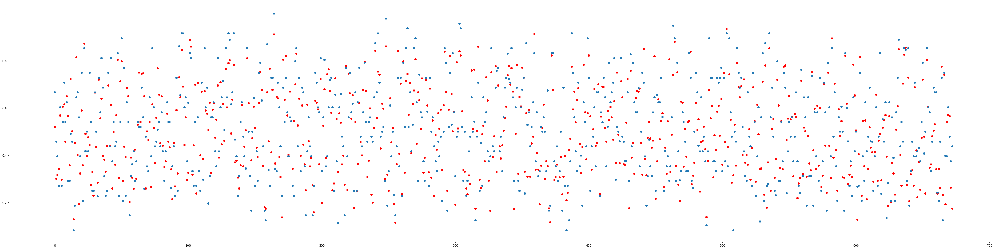

In [121]:
plt.figure(figsize=(60,15))
plt.scatter(range(len(np.concatenate(y_pred,axis=0))),np.concatenate(y_pred,axis=0),c='r')
plt.scatter(range(len(np.array(test_intensities))),np.array(test_intensities))

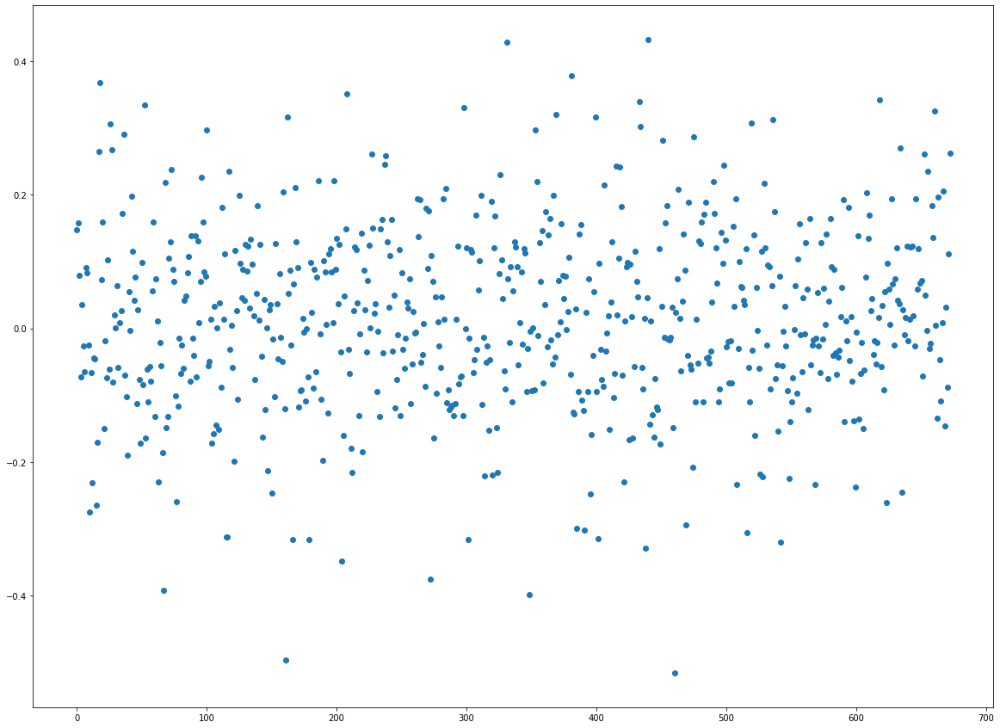

In [122]:
plt.figure(figsize=(20,15))
plt.scatter(range(len(np.array(test_intensities))),np.array(test_intensities)-np.concatenate(y_pred,axis=0))

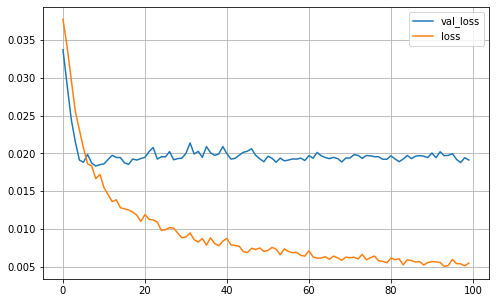

In [123]:
# show the learning curve
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)

In [124]:
neural_network_path = "files/final_models/" + "lstmatt_"+ emotion + ".h5"

neural_network_path

'files/final_models/lstmatt_sadness.h5'

In [125]:
model.save(neural_network_path)

In [126]:
from keras.models import load_model
# Assuming your model includes instance of an "AttentionLayer" class
model1 = load_model(neural_network_path, custom_objects=SeqWeightedAttention.get_custom_objects())

# 4. Compare the Performance and Training Time Results

In [127]:
trainingtime

,Classifier,Training Time(Seconds)
0,LSTM-Attention,142.08


In [128]:
trainingtime.to_csv("training_time_lstmatt_"+emotion+".csv",mode='w')

In [129]:
all_score = pd.DataFrame(data = [score1], columns = ['pears-corr','spear-corr','pears-corr-range-05-1','spear-corr-range-05-1'],\
             index = ['LSTM-Attention'])
all_score

,pears-corr,spear-corr,pears-corr-range-05-1,spear-corr-range-05-1
LSTM-Attention,0.750992,0.741764,0.588037,0.582714


In [130]:
all_score.to_csv('score_lstmatt_'+emotion+'.csv',mode='w')

In [131]:
r2_square = pd.DataFrame(data = [score2], columns = ['R-squared score'],\
             index = ['LSTM-Attention'])
r2_square

,R-squared score
LSTM-Attention,0.534247


In [ ]:
r2_score.to_csv('r2_score_lstmatt_'+emotion+'.csv',mode='w')

# 5. Explore the Performance Using a Single Word Embeddings / Lexicon

In [132]:
def generate_WEM(unigram_feature_string):
    EMBEDDING_DIM = len(get_unigram_embedding("glad", embedding_info, unigram_feature_string))
    print(max_len, EMBEDDING_DIM)
    
    word_embedding_matrix = list()
    word_embedding_matrix.append(np.zeros(EMBEDDING_DIM))

    for word in sorted(word_indices, key=word_indices.get):
        if word in list(embedding_info.keys()):
            embedding_features = get_unigram_embedding(word, embedding_info, unigram_feature_string)    
            word_embedding_matrix.append(embedding_features)

    word_embedding_matrix = np.asarray(word_embedding_matrix, dtype='f')
    print(word_embedding_matrix.shape)
    
    new_word_indices = word_embedding_matrix.shape[0]
    
    from sklearn.preprocessing import scale
    word_embedding_matrix = scale(word_embedding_matrix)
    return EMBEDDING_DIM, word_embedding_matrix

In [133]:
def define_model(vocab_size, max_length,EMBEDDING_DIM,word_embedding_matrix):
    model = models.Sequential()
    #model.add( Embedding(new_word_indices, 32,  mask_zero=True))
    model.add(Embedding(vocab_size, EMBEDDING_DIM, weights=[word_embedding_matrix], 
                    input_length=max_len, trainable=False))
    model.add(Dropout(0.5))
    model.add(Bidirectional(LSTM(16, return_sequences=True)))
    
    model.add(Dropout(0.5))
    # add an attention layer

    # model.add(SeqSelfAttention(attention_activation='sigmoid'))
    model.add(SeqWeightedAttention())
    model.add(Dropout(0.5))
    
    model.add(Dense(1, activation='sigmoid') )

    model.compile(loss='mean_squared_error', optimizer="adam")
    return model

In [134]:
def model_explore(unigram_feature_string):
    EMBEDDING_DIM, WEM = generate_WEM(unigram_feature_string)
    model= define_model(new_word_indices, max_len, EMBEDDING_DIM, WEM)
    score_train = np.asarray(train_intensities)

    history = model.fit(train_encode, score_train, epochs=100, batch_size=32, verbose=1, validation_data=(test_encode,np.asarray(test_intensities))) 
 
    y_pred = model.predict(test_encode)
    
    score1 = evaluate_lists(np.concatenate(y_pred,axis=0),test_intensities)
    score2 = r2_score(np.array(test_intensities), np.concatenate(y_pred,axis=0))
    return score1, score2


In [135]:
unigram_feature_string_set = ["100000000000","010000000000","001000000000","000100000000","000010000000","000001000000",\
 "000000100000", "000000010000", "000000001000", "000000000100", "000000000010","000000000001","110000000000", "001111111111"]
for i in unigram_feature_string_set:
    print(get_features_from_identifier(i))

['Glove[Twitter]']
['Word2Vec[Twitter]']
['NRC-Emotion Intensity Lexicon']
['Wordnet-Affect']
['NRC-Emotion-Lexicon']
['NRC-Emoticon-Lexicon']
['NRC-Emoticon-AffLexNegLex']
['NRC-Hashtag-Emotion']
['NRC-Hashtag-Sentiment-Lexicon']
['NRC-Hashtag-Sentiment-AffLexNegLex']
['Emoji Intensity']
['Depeche Mood']
['Glove[Twitter]', 'Word2Vec[Twitter]']
['NRC-Emotion Intensity Lexicon', 'Wordnet-Affect', 'NRC-Emotion-Lexicon', 'NRC-Emoticon-Lexicon', 'NRC-Emoticon-AffLexNegLex', 'NRC-Hashtag-Emotion', 'NRC-Hashtag-Sentiment-Lexicon', 'NRC-Hashtag-Sentiment-AffLexNegLex', 'Emoji Intensity', 'Depeche Mood']


In [136]:
score1_1, score2_1 = model_explore(unigram_feature_string_set[0])
score1_2, score2_2 = model_explore(unigram_feature_string_set[1])
score1_3, score2_3 = model_explore(unigram_feature_string_set[2])
score1_4, score2_4 = model_explore(unigram_feature_string_set[3])
score1_5, score2_5 = model_explore(unigram_feature_string_set[4])
score1_6, score2_6 = model_explore(unigram_feature_string_set[5])
score1_7, score2_7 = model_explore(unigram_feature_string_set[6])
score1_8, score2_8 = model_explore(unigram_feature_string_set[7])
score1_9, score2_9 = model_explore(unigram_feature_string_set[8])
score1_10, score2_10 = model_explore(unigram_feature_string_set[9])
score1_11, score2_11 = model_explore(unigram_feature_string_set[10])
score1_12, score2_12 = model_explore(unigram_feature_string_set[11])

32 200
(4752, 200)


C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0365 - val_loss: 0.0370
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0346 - val_loss: 0.0344
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0324 - val_loss: 0.0315
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0304 - val_loss: 0.0267
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0268 - val_loss: 0.0263
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0257 - val_loss: 0.0206
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0230 - val_loss: 0.0209
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0227 - val_loss: 0.0204
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0228 - val_loss: 0.0184
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0085 - val_loss: 0.0222
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0087 - val_loss: 0.0210
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0096 - val_loss: 0.0214
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0083 - val_loss: 0.0211
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0084 - val_loss: 0.0211
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0083 - val_loss: 0.0219
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0080 - val_loss: 0.0219
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0092 - val_loss: 0.0221
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0087 - val_loss: 0.0214
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0086

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0409 - val_loss: 0.0404
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0352 - val_loss: 0.0369
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0334 - val_loss: 0.0345
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0326 - val_loss: 0.0309
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0288 - val_loss: 0.0277
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0249 - val_loss: 0.0236
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0224 - val_loss: 0.0218
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0210 - val_loss: 0.0206
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0206 - val_loss: 0.0201
Epoch 10/100
860/860 [=======================

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0384 - val_loss: 0.0379
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0360 - val_loss: 0.0344
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0341 - val_loss: 0.0329
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0349 - val_loss: 0.0313
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0341 - val_loss: 0.0299
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0321 - val_loss: 0.0293
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0324 - val_loss: 0.0284
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0324 - val_loss: 0.0281
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0318 - val_loss: 0.0276
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0276 - val_loss: 0.0289
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0273 - val_loss: 0.0282
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0271 - val_loss: 0.0288
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0259 - val_loss: 0.0276
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0271 - val_loss: 0.0278
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0267 - val_loss: 0.0277
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0267 - val_loss: 0.0279
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0273 - val_loss: 0.0288
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0260 - val_loss: 0.0294
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0264

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0413 - val_loss: 0.0411
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0400 - val_loss: 0.0405
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0388 - val_loss: 0.0387
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0377 - val_loss: 0.0380
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0360 - val_loss: 0.0376
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0350 - val_loss: 0.0371
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0340 - val_loss: 0.0368
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0346 - val_loss: 0.0364
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0340 - val_loss: 0.0359
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0321 - val_loss: 0.0368
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0318 - val_loss: 0.0366
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0324 - val_loss: 0.0375
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0316 - val_loss: 0.0365
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0315 - val_loss: 0.0370
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0321 - val_loss: 0.0369
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0320 - val_loss: 0.0363
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0312 - val_loss: 0.0365
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0325 - val_loss: 0.0372
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0321

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0524 - val_loss: 0.0433
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0414 - val_loss: 0.0439
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0392 - val_loss: 0.0421
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0377 - val_loss: 0.0419
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0381 - val_loss: 0.0413
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0365 - val_loss: 0.0421
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0364 - val_loss: 0.0418
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0363 - val_loss: 0.0400
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0350 - val_loss: 0.0417
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0327 - val_loss: 0.0394
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0329 - val_loss: 0.0392
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0320 - val_loss: 0.0394
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0332 - val_loss: 0.0391
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0333 - val_loss: 0.0390
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0335 - val_loss: 0.0389
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0335 - val_loss: 0.0389
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0328 - val_loss: 0.0389
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0335 - val_loss: 0.0388
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0330

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0436 - val_loss: 0.0386
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0386 - val_loss: 0.0360
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0357 - val_loss: 0.0336
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0333 - val_loss: 0.0312
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0319 - val_loss: 0.0295
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0308 - val_loss: 0.0286
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0284 - val_loss: 0.0280
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0289 - val_loss: 0.0281
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0283 - val_loss: 0.0278
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0230 - val_loss: 0.0248
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0234 - val_loss: 0.0246
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0242 - val_loss: 0.0246
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0242 - val_loss: 0.0246
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0231 - val_loss: 0.0246
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0246 - val_loss: 0.0243
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0236 - val_loss: 0.0243
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0236 - val_loss: 0.0244
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0241 - val_loss: 0.0243
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0244

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0389 - val_loss: 0.0401
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0357 - val_loss: 0.0387
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0349 - val_loss: 0.0370
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0325 - val_loss: 0.0348
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0317 - val_loss: 0.0329
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0285 - val_loss: 0.0313
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0283 - val_loss: 0.0308
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0276 - val_loss: 0.0295
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0279 - val_loss: 0.0288
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0241 - val_loss: 0.0253
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0238 - val_loss: 0.0254
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0234 - val_loss: 0.0260
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0240 - val_loss: 0.0263
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0241 - val_loss: 0.0262
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0242 - val_loss: 0.0256
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0244 - val_loss: 0.0266
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0233 - val_loss: 0.0264
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0238 - val_loss: 0.0267
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0218

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0456 - val_loss: 0.0388
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0381 - val_loss: 0.0370
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0356 - val_loss: 0.0366
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0357 - val_loss: 0.0350
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0361 - val_loss: 0.0366
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0336 - val_loss: 0.0366
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0328 - val_loss: 0.0344
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0315 - val_loss: 0.0353
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0321 - val_loss: 0.0337
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0289 - val_loss: 0.0301
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0289 - val_loss: 0.0300
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0286 - val_loss: 0.0300
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0290 - val_loss: 0.0300
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0298 - val_loss: 0.0301
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0289 - val_loss: 0.0301
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0295 - val_loss: 0.0303
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0293 - val_loss: 0.0305
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0293 - val_loss: 0.0302
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0289

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0465 - val_loss: 0.0481
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0396 - val_loss: 0.0428
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0363 - val_loss: 0.0427
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0363 - val_loss: 0.0405
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0364 - val_loss: 0.0397
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0361 - val_loss: 0.0392
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0339 - val_loss: 0.0387
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0344 - val_loss: 0.0384
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0330 - val_loss: 0.0383
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0310 - val_loss: 0.0359
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0317 - val_loss: 0.0358
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0302 - val_loss: 0.0359
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0312 - val_loss: 0.0358
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0310 - val_loss: 0.0358
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0311 - val_loss: 0.0357
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0311 - val_loss: 0.0358
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0304 - val_loss: 0.0359
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0314 - val_loss: 0.0359
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0302

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0373 - val_loss: 0.0420
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0367 - val_loss: 0.0413
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0362 - val_loss: 0.0408
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0358 - val_loss: 0.0408
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0359 - val_loss: 0.0404
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0348 - val_loss: 0.0397
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0353 - val_loss: 0.0387
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0348 - val_loss: 0.0390
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0347 - val_loss: 0.0384
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0333 - val_loss: 0.0366
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0327 - val_loss: 0.0360
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0330 - val_loss: 0.0357
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0337 - val_loss: 0.0364
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0327 - val_loss: 0.0364
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0327 - val_loss: 0.0360
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0333 - val_loss: 0.0355
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0334 - val_loss: 0.0363
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0336 - val_loss: 0.0365
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0332

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0409 - val_loss: 0.0465
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0377 - val_loss: 0.0457
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0374 - val_loss: 0.0448
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0379 - val_loss: 0.0446
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0376 - val_loss: 0.0439
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0364 - val_loss: 0.0442
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0375 - val_loss: 0.0435
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0363 - val_loss: 0.0438
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0364 - val_loss: 0.0438
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0344 - val_loss: 0.0411
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0348 - val_loss: 0.0410
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0345 - val_loss: 0.0408
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0348 - val_loss: 0.0413
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0347 - val_loss: 0.0407
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0349 - val_loss: 0.0406
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0346 - val_loss: 0.0410
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0351 - val_loss: 0.0406
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0347 - val_loss: 0.0407
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0345

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0420 - val_loss: 0.0455
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0383 - val_loss: 0.0417
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0363 - val_loss: 0.0384
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0352 - val_loss: 0.0369
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0351 - val_loss: 0.0365
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0344 - val_loss: 0.0359
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0338 - val_loss: 0.0351
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0344 - val_loss: 0.0345
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0329 - val_loss: 0.0346
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0201 - val_loss: 0.0289
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0175 - val_loss: 0.0286
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0186 - val_loss: 0.0285
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0180 - val_loss: 0.0292
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0194 - val_loss: 0.0287
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0184 - val_loss: 0.0289
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0181 - val_loss: 0.0291
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0177 - val_loss: 0.0296
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0167 - val_loss: 0.0293
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0186

In [137]:
# all word embeddings
score1_13, score2_13 = model_explore(unigram_feature_string_set[12])

# all lexicons
score1_14, score2_14 = model_explore(unigram_feature_string_set[13])

32 600
(4752, 600)


C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0380 - val_loss: 0.0378
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0344 - val_loss: 0.0339
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0314 - val_loss: 0.0319
Epoch 4/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0296 - val_loss: 0.0268
Epoch 5/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0263 - val_loss: 0.0239
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0222 - val_loss: 0.0185
Epoch 7/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0202 - val_loss: 0.0181
Epoch 8/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0182 - val_loss: 0.0179
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0174 - val_loss: 0.0180
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0055 - val_loss: 0.0214
Epoch 82/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0057 - val_loss: 0.0215
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0057 - val_loss: 0.0206
Epoch 84/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0050 - val_loss: 0.0215
Epoch 85/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0056 - val_loss: 0.0230
Epoch 86/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0052 - val_loss: 0.0211
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0054 - val_loss: 0.0207
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0052 - val_loss: 0.0209
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0052 - val_loss: 0.0205
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0048

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 860 samples, validate on 673 samples
Epoch 1/100
860/860 [==============================] - 2s 2ms/step - loss: 0.0369 - val_loss: 0.0378
Epoch 2/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0357 - val_loss: 0.0336
Epoch 3/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0327 - val_loss: 0.0322
Epoch 4/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0308 - val_loss: 0.0286
Epoch 5/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0295 - val_loss: 0.0281
Epoch 6/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0275 - val_loss: 0.0248
Epoch 7/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0267 - val_loss: 0.0236
Epoch 8/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0249 - val_loss: 0.0228
Epoch 9/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0239 - val_loss: 0.0220
Epoch 10/100
860/860 [=======================

Epoch 81/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0142 - val_loss: 0.0199
Epoch 82/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0136 - val_loss: 0.0200
Epoch 83/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0136 - val_loss: 0.0207
Epoch 84/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0137 - val_loss: 0.0205
Epoch 85/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0142 - val_loss: 0.0203
Epoch 86/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0142 - val_loss: 0.0206
Epoch 87/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0143 - val_loss: 0.0209
Epoch 88/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0133 - val_loss: 0.0213
Epoch 89/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0130 - val_loss: 0.0203
Epoch 90/100
860/860 [==============================] - 1s 2ms/step - loss: 0.0136

In [138]:
pd.DataFrame(data = [score1_1, score1_2, score1_3, score1_4, score1_5, score1_6, score1_7,\
                     score1_8, score1_9, score1_10, score1_11, score1_12, score1_13, score1_14, score1],\
             columns = ['pears-corr','spear-corr','pears-corr-range-05-1', 'spear-corr-range-05-1'],\
             index = ['Glove[Twitter]','Word2Vec[Twitter]','NRC-Emotion Intensity Lexicon','Wordnet-Affect','NRC-Emotion-Lexicon',\
                       'NRC-Emoticon-Lexicon', 'NRC-Emoticon-AffLexNegLex', 'NRC-Hashtag-Emotion', 'NRC-Hashtag-Sentiment-Lexicon',\
                       'NRC-Hashtag-Sentiment-AffLexNegLex', 'Emoji Intensity', 'Depeche Mood','All Word Embeddings',\
                      'All Lexicons','All Features'])

,pears-corr,spear-corr,pears-corr-range-05-1,spear-corr-range-05-1
Glove[Twitter],0.732568,0.726989,0.531835,0.561929
Word2Vec[Twitter],0.727906,0.725817,0.528794,0.550473
NRC-Emotion Intensity Lexicon,0.622423,0.602949,0.450351,0.433852
Wordnet-Affect,0.397809,0.398785,0.242855,0.243691
NRC-Emotion-Lexicon,0.274913,0.249061,0.270303,0.225438
NRC-Emoticon-Lexicon,0.648024,0.637229,0.525222,0.514018
NRC-Emoticon-AffLexNegLex,0.640333,0.627255,0.513242,0.488561
NRC-Hashtag-Emotion,0.527999,0.504819,0.362046,0.357628
NRC-Hashtag-Sentiment-Lexicon,0.353250,0.346866,0.125073,0.126118
NRC-Hashtag-Sentiment-AffLexNegLex,0.398119,0.426232,0.164221,0.194871


In [139]:
pd.DataFrame(data = [score2_1, score2_2, score2_3, score2_4, score2_5, score2_6, score2_7,\
                     score2_8, score2_9, score2_10, score2_11, score2_12, score2_13, score2_14, score2], columns = ['R-squared score'],\
             index = ['Glove[Twitter]','Word2Vec[Twitter]','NRC-Emotion Intensity Lexicon','Wordnet-Affect','NRC-Emotion-Lexicon',\
                       'NRC-Emoticon-Lexicon', 'NRC-Emoticon-AffLexNegLex', 'NRC-Hashtag-Emotion', 'NRC-Hashtag-Sentiment-Lexicon',\
                       'NRC-Hashtag-Sentiment-AffLexNegLex', 'Emoji Intensity', 'Depeche Mood','All Word Embeddings',\
                      'All Lexicons','All Features'])

,R-squared score
Glove[Twitter],0.476294
Word2Vec[Twitter],0.454753
NRC-Emotion Intensity Lexicon,0.289888
Wordnet-Affect,0.113999
NRC-Emotion-Lexicon,0.046826
NRC-Emoticon-Lexicon,0.407631
NRC-Emoticon-AffLexNegLex,0.382605
NRC-Hashtag-Emotion,0.266665
NRC-Hashtag-Sentiment-Lexicon,0.124706
NRC-Hashtag-Sentiment-AffLexNegLex,0.117321
